In [1]:
import pandas as pd

import sqlite3
from sqlite3 import Error
import seaborn as sns
import numpy as np
from numpy import mean
from numpy import std
import matplotlib as plt 
%matplotlib inline
from matplotlib.pylab import rcParams
import matplotlib.pyplot as plt
import sklearn
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_regression
from sklearn import preprocessing
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.datasets import make_blobs
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, cross_val_predict



In [2]:
df = pd.read_excel("ampa_wmt_rto_hackathon_july-22_data.xlsx", sheet_name=['animal_data','shelter_data'])
animal_data = df['animal_data']
shelter_data = df['shelter_data']

In [3]:
animal_data

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address
0,Rochester,2021-01-28,Dog,-77.633991,43.177237,-77.634618,43.178387,0.085445,158 Glenwood ave Rochester 14613,54 Tacoma Street Rochester NY 14613
1,Rochester,2021-01-30,Dog,-77.599173,43.185495,-77.583367,43.171650,1.245466,1094 HUDSON AVE 14621 Rochester 14621,31 CROMBIE ST Rochester NY 14605
2,Rochester,2021-01-30,Dog,-77.617074,43.241926,-77.615373,43.249483,0.528722,17 Hughes pl Rochester 14608,4313 LAKE AVE Rochester NY 14612
3,Rochester,2021-02-01,Dog,-77.643231,43.180933,-77.645970,43.179665,0.163735,DRIVING PK and 2 CANARY ST. Rochester 14608,1 CANARY ST Rochester NY 14613
4,Rochester,2021-02-03,Dog,-77.650684,43.143780,-77.653187,43.145435,0.170467,74 Thurston Rd Rochester 14608,216 DEPEW Street Rochester NY 14611
...,...,...,...,...,...,...,...,...,...,...
23075,Atlanta,2019-01-31,Dog,-84.288835,33.726502,-84.276410,33.706781,1.536071,"2476 Brentwood Road DECATUR, 30032, GA",2176 Loving Drive Decatur GA 30037
23076,Atlanta,2019-11-18,Dog,-84.191581,33.718448,-84.192158,33.718910,0.046022,4822 Truitt Ln GA 30035,4807 Wilkins Station Dr GA 30035
23077,Atlanta,2019-11-19,Dog,-84.280404,33.829848,-84.281226,33.830973,0.090819,"1631 Hartland Drive Decatur, 30033 GA",1668 Hartland Dr Decatur GA 30033
23078,Atlanta,2019-02-12,Dog,-84.285380,33.697093,-84.283554,33.698049,0.124132,2549 Mcglynn Drive GA 30034,254 McGlynn Drive Decatur GA 30034


## understanding Animal Data 

In [4]:
animal_data.columns

Index(['shelter_id', 'intake_date', 'Species', 'found_lng', 'found_lat',
       'outcome_lng', 'outcome_lat', 'distance_miles', 'found_address',
       'outcome_address'],
      dtype='object')

In [5]:
dt = animal_data[['shelter_id','Species','distance_miles']]

In [6]:
dt

,shelter_id,Species,distance_miles
0,Rochester,Dog,0.085445
1,Rochester,Dog,1.245466
2,Rochester,Dog,0.528722
3,Rochester,Dog,0.163735
4,Rochester,Dog,0.170467
...,...,...,...
23075,Atlanta,Dog,1.536071
23076,Atlanta,Dog,0.046022
23077,Atlanta,Dog,0.090819
23078,Atlanta,Dog,0.124132


<Figure size 1152x2160 with 0 Axes>

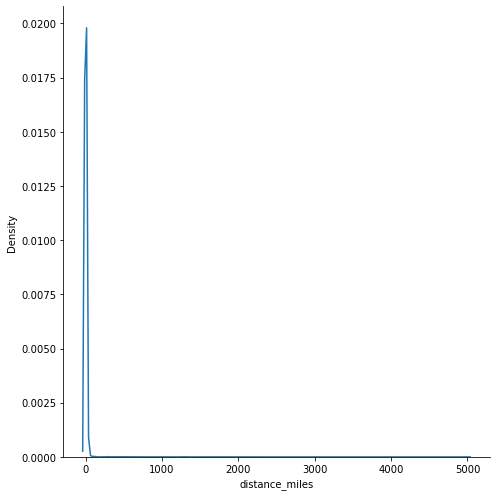

In [7]:
plt.figure(figsize=(16, 30))
g = sns.displot(data=dt, x="distance_miles", kind= "kde", height = 7)

most of the animals were found close to the outcome address and were able to be returned 

In [8]:
dt['shelter_id'].unique()

array(['Rochester', 'Oakland', 'Fresno', 'Mcallen', 'Tucson', 'Madera',
       'Las Vegas', 'Dallas', 'San Diego', 'Pasco', 'Atlanta'],
      dtype=object)

In [9]:
keys = [1,2,3,4,5,6,7,8,9,10,11]
x = dict(zip(dt['shelter_id'].unique(), keys))
x

{'Rochester': 1,
 'Oakland': 2,
 'Fresno': 3,
 'Mcallen': 4,
 'Tucson': 5,
 'Madera': 6,
 'Las Vegas': 7,
 'Dallas': 8,
 'San Diego': 9,
 'Pasco': 10,
 'Atlanta': 11}

In [10]:
dt2=dt.replace({"shelter_id": x})

In [11]:
dt2

,shelter_id,Species,distance_miles
0,1,Dog,0.085445
1,1,Dog,1.245466
2,1,Dog,0.528722
3,1,Dog,0.163735
4,1,Dog,0.170467
...,...,...,...
23075,11,Dog,1.536071
23076,11,Dog,0.046022
23077,11,Dog,0.090819
23078,11,Dog,0.124132


In [12]:
dt['Species'].unique()

array(['Dog', 'Cat', 'Pet Reptile', 'Pig', 'Horse', 'Rabbit', 'DOG', nan,
       'Other'], dtype=object)

In [13]:
dt2.loc[dt2['Species'] == "DOG", "Species"] = 'Dog'

In [14]:
dt2['Species'].unique()

array(['Dog', 'Cat', 'Pet Reptile', 'Pig', 'Horse', 'Rabbit', nan,
       'Other'], dtype=object)

In [15]:
dt2['Species'].nunique()

7

In [16]:
dt2.nunique()

shelter_id           11
Species               7
distance_miles    18458
dtype: int64

In [17]:
keys2 = [101,102,103,104,105,106,100,107]
y = dict(zip(dt2['Species'].unique(), keys2))
y

{'Dog': 101,
 'Cat': 102,
 'Pet Reptile': 103,
 'Pig': 104,
 'Horse': 105,
 'Rabbit': 106,
 nan: 100,
 'Other': 107}

In [18]:
dt3=dt2.replace({"Species": y})

In [19]:
dt3['Species'].unique()

array([101, 102, 103, 104, 105, 106, 100, 107])

In [20]:
dt3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23080 entries, 0 to 23079
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   shelter_id      23080 non-null  int64  
 1   Species         23080 non-null  int64  
 2   distance_miles  23054 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 541.1 KB


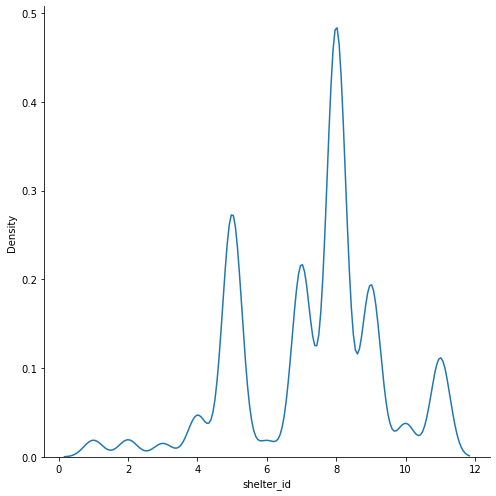

In [21]:
sns.displot(data=dt3,  x="shelter_id", kind="kde",height = 7)

denisity of most animals are at shlter id 8 being dallas 

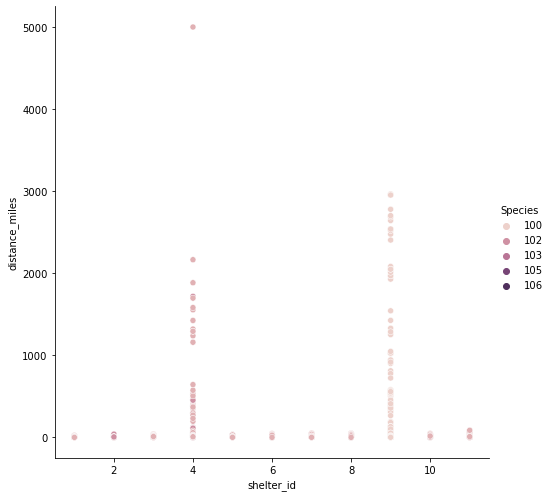

In [22]:
ax = sns.relplot(data=dt3, x="shelter_id", y="distance_miles",hue = "Species",height = 7)
g.ax.axline(xy1=(10, 10), slope=.2, color="b", dashes=(5, 2))

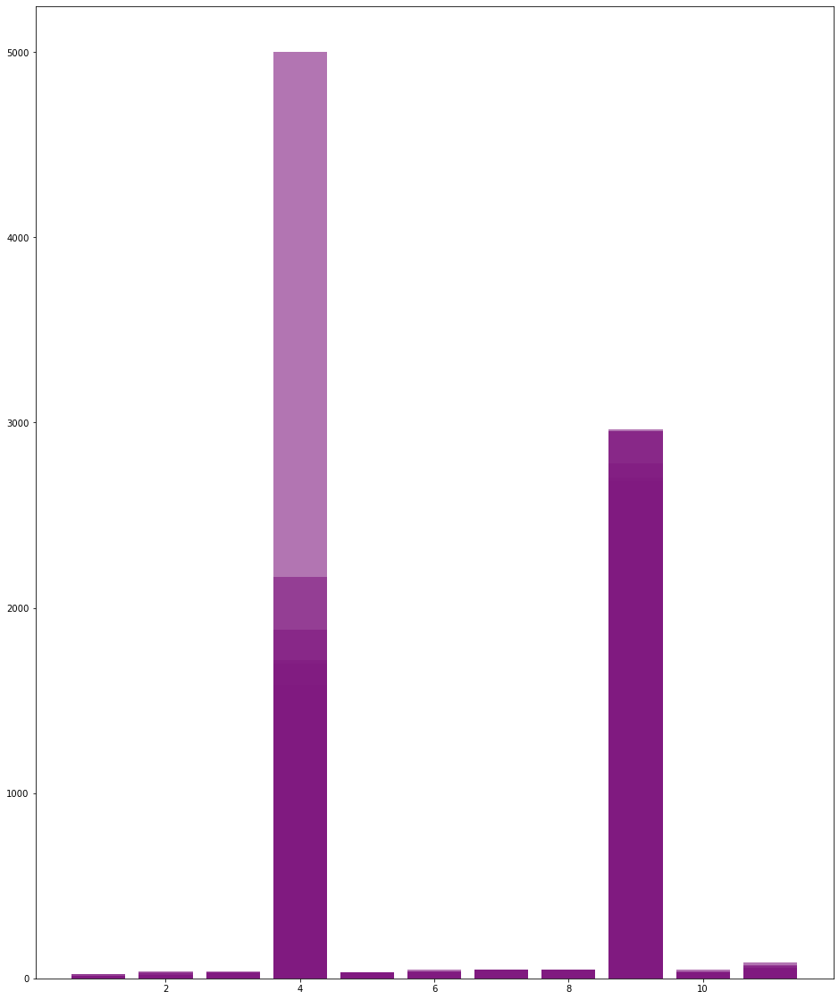

In [23]:
plt.figure(figsize=(16, 20))
plt.bar(dt3.shelter_id, dt3.distance_miles, color = (0.5,0.1,0.5,0.6))
plt.show()

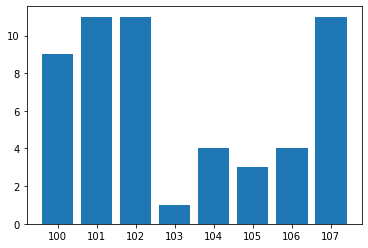

In [24]:

plt.bar(dt3.Species, dt3.shelter_id,)
plt.show()

## understanding shelter Data 

In [25]:
shelter_data = df['shelter_data']

In [26]:
shelter_data

,shelter_id,annual_intake_2019,annual_intake_2020,annual_intake_2021,jurisdiction_size_sq_km,justidiction_state,jurisdiction_region,jurisdiction_pop_size,jurisdiction_pop_density_person_per_sq_km
0,Rochester,3867,2732.0,2677.0,3541,NY,Monroe County,741770,209.480373
1,Oakland,6188,5234.0,7613.0,1914,CA,Alameda County,1682353,878.972309
2,Fresno,8001,6246.0,6634.0,15568,CA,Fresno County,999101,64.176580
3,Mcallen,21815,15511.0,15283.0,4100,TX,Hidalgo County,868707,211.879756
4,Tucson,27064,17547.0,23940.0,23799,AZ,Pima County,1043433,43.843565
5,Madera,5166,NaN,NaN,5576,CA,Madera County,156255,28.022776
6,Las Vegas,27922,17957.0,NaN,20878,NV,Clark County,2265461,108.509484
7,Dallas,40155,19594.0,18533.0,1992,TX,Dallas City,1304379,654.808735
8,San Diego,33555,31871.0,30803.0,11036,TX,San Diego County,3338000,302.464661
9,Pasco,9906,11370.0,6510.0,2250,FL,Pasco County,553947,246.198667


In [27]:
dfnew = shelter_data[['shelter_id','annual_intake_2019','annual_intake_2020','annual_intake_2021']]

<AxesSubplot:xlabel='shelter_id'>

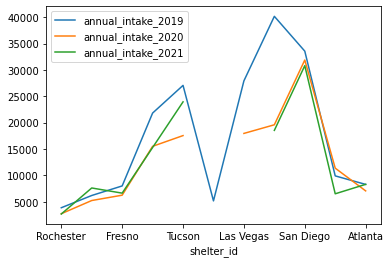

In [28]:
dfnew.set_index('shelter_id').plot()

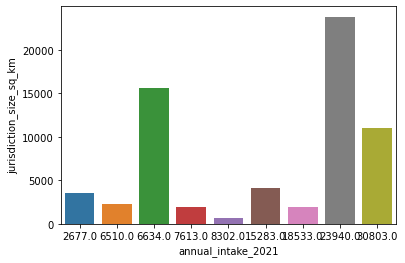

In [29]:
ax = sns.barplot(data=shelter_data, x = 'annual_intake_2021'  , y = 'jurisdiction_size_sq_km')

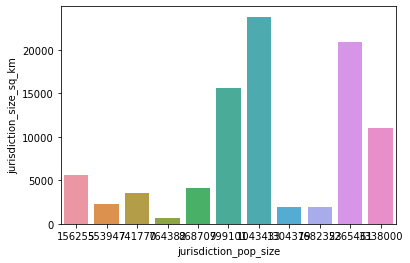

In [30]:
ax = sns.barplot(data=shelter_data, x = 'jurisdiction_pop_size'  , y = 'jurisdiction_size_sq_km')

## observations from graphs 

from the above graphs we understand 
- shelter in dallas tho less in size compared to other shlters has more density of animal intake and has increased this intake stedily over the years . 
- Dallas shelter has the highest size/pop ratio helping with the animal adoptation number 
- Most number of species in the shelters are dogs and cats  

In [48]:
ax1=animal_data.replace({"shelter_id": x})
ax1.loc[ax1['Species'] == "DOG", "Species"] = 'Dog'
keys2 = [101,102,103,104,105,106,100,107]
y = dict(zip(dt2['Species'].unique(), keys2))
ax2 = ax1.replace({"Species": y})
mask3 = (((ax2['shelter_id'] == 7)))
dt4 = ax2[mask3][['shelter_id', 'intake_date', 'Species', 'found_lng', 'found_lat',
       'outcome_lng', 'outcome_lat', 'distance_miles', 'found_address',
       'outcome_address']]

In [49]:
dt4

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address
6296,7,2019-01-01,101,-115.106554,36.176480,-115.239166,36.290830,10.818320,655 MOJAVE RD LAS VEGAS NV 89101,6658 ELKHORN RD LAS VEGAS NV 89131
6297,7,2019-01-01,101,-115.133817,36.247944,-115.148735,36.254894,0.961063,4824 CELSION ROCK ST NORTH LAS VEGAS NV 89081,5216 JOSE ERNESTO ST NORTH LAS VEGAS NV 89031
6298,7,2019-01-01,101,-115.156539,36.273654,-115.186855,36.240394,2.850475,1030 STABLE GLEN DR NORTH LAS VEGAS NV 89031,4427 NORMA JEAN LN NORTH LAS VEGAS NV 89031
6299,7,2019-01-01,101,-115.108231,36.196280,-115.096616,36.230593,2.453264,2842 LAKE MEAD BLVD NORTH LAS VEGAS NV 89030,3903 EBLICK WASH DR LAS VEGAS NV 89115
6300,7,2019-01-01,101,-115.177355,36.284546,-115.179977,36.280232,0.331535,6600 ALIANTE PKWY NORTH LAS VEGAS NV 89084,2904 GNATCATCHER AVE NORTH LAS VEGAS NV 89084
...,...,...,...,...,...,...,...,...,...,...
9772,7,2019-12-31,101,-115.106300,36.216030,-115.093200,36.210170,0.834574,3130 BLACKFOOT CT NORTH LAS VEGAS NV 89030,3847 ALTO AVE LAS VEGAS NV 89115
9773,7,2019-12-31,101,-115.235100,36.189300,-115.078500,36.119840,9.977234,6500 VEGAS DR LAS VEGAS NV 89108,3834 FLORRIE AVE LAS VEGAS NV 89121
9774,7,2019-12-31,101,-115.167300,36.124400,-115.145600,36.093190,2.471943,3355 LAS VEGAS BLVD LAS VEGAS NV 89109,3770 SWENSON ST LAS VEGAS NV 89119
9775,7,2019-12-31,101,-115.125400,36.170490,-115.125000,36.170360,0.027519,389 BRUCE ST LAS VEGAS NV 89101,1701 CEDAR AVE LAS VEGAS NV 89101


In [33]:
dt4['intake_date'].nunique()
# plt.bar(dt4.intake_date,height = 7)
# plt.show()

364

In [50]:
dt4['month'] = pd. DatetimeIndex(dt4['intake_date']). month

In [35]:
dt4

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address,month
6296,7,2019-01-01,101,-115.106554,36.176480,-115.239166,36.290830,10.818320,655 MOJAVE RD LAS VEGAS NV 89101,6658 ELKHORN RD LAS VEGAS NV 89131,1
6297,7,2019-01-01,101,-115.133817,36.247944,-115.148735,36.254894,0.961063,4824 CELSION ROCK ST NORTH LAS VEGAS NV 89081,5216 JOSE ERNESTO ST NORTH LAS VEGAS NV 89031,1
6298,7,2019-01-01,101,-115.156539,36.273654,-115.186855,36.240394,2.850475,1030 STABLE GLEN DR NORTH LAS VEGAS NV 89031,4427 NORMA JEAN LN NORTH LAS VEGAS NV 89031,1
6299,7,2019-01-01,101,-115.108231,36.196280,-115.096616,36.230593,2.453264,2842 LAKE MEAD BLVD NORTH LAS VEGAS NV 89030,3903 EBLICK WASH DR LAS VEGAS NV 89115,1
6300,7,2019-01-01,101,-115.177355,36.284546,-115.179977,36.280232,0.331535,6600 ALIANTE PKWY NORTH LAS VEGAS NV 89084,2904 GNATCATCHER AVE NORTH LAS VEGAS NV 89084,1
...,...,...,...,...,...,...,...,...,...,...,...
9772,7,2019-12-31,101,-115.106300,36.216030,-115.093200,36.210170,0.834574,3130 BLACKFOOT CT NORTH LAS VEGAS NV 89030,3847 ALTO AVE LAS VEGAS NV 89115,12
9773,7,2019-12-31,101,-115.235100,36.189300,-115.078500,36.119840,9.977234,6500 VEGAS DR LAS VEGAS NV 89108,3834 FLORRIE AVE LAS VEGAS NV 89121,12
9774,7,2019-12-31,101,-115.167300,36.124400,-115.145600,36.093190,2.471943,3355 LAS VEGAS BLVD LAS VEGAS NV 89109,3770 SWENSON ST LAS VEGAS NV 89119,12
9775,7,2019-12-31,101,-115.125400,36.170490,-115.125000,36.170360,0.027519,389 BRUCE ST LAS VEGAS NV 89101,1701 CEDAR AVE LAS VEGAS NV 89101,12


In [51]:
dt4['counts'] = dt4.month.map(dt4.month.value_counts())

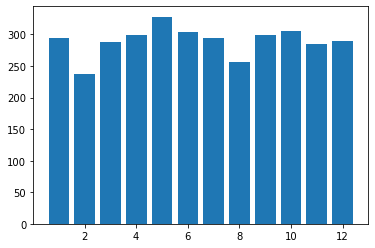

In [37]:
plt.bar(dt4.month,dt4.counts)
plt.show()
## we understand nothing about the intake patters from below 

In [38]:
dt4

,shelter_id,intake_date,Species,found_lng,found_lat,outcome_lng,outcome_lat,distance_miles,found_address,outcome_address,month,counts
6296,7,2019-01-01,101,-115.106554,36.176480,-115.239166,36.290830,10.818320,655 MOJAVE RD LAS VEGAS NV 89101,6658 ELKHORN RD LAS VEGAS NV 89131,1,294
6297,7,2019-01-01,101,-115.133817,36.247944,-115.148735,36.254894,0.961063,4824 CELSION ROCK ST NORTH LAS VEGAS NV 89081,5216 JOSE ERNESTO ST NORTH LAS VEGAS NV 89031,1,294
6298,7,2019-01-01,101,-115.156539,36.273654,-115.186855,36.240394,2.850475,1030 STABLE GLEN DR NORTH LAS VEGAS NV 89031,4427 NORMA JEAN LN NORTH LAS VEGAS NV 89031,1,294
6299,7,2019-01-01,101,-115.108231,36.196280,-115.096616,36.230593,2.453264,2842 LAKE MEAD BLVD NORTH LAS VEGAS NV 89030,3903 EBLICK WASH DR LAS VEGAS NV 89115,1,294
6300,7,2019-01-01,101,-115.177355,36.284546,-115.179977,36.280232,0.331535,6600 ALIANTE PKWY NORTH LAS VEGAS NV 89084,2904 GNATCATCHER AVE NORTH LAS VEGAS NV 89084,1,294
...,...,...,...,...,...,...,...,...,...,...,...,...
9772,7,2019-12-31,101,-115.106300,36.216030,-115.093200,36.210170,0.834574,3130 BLACKFOOT CT NORTH LAS VEGAS NV 89030,3847 ALTO AVE LAS VEGAS NV 89115,12,290
9773,7,2019-12-31,101,-115.235100,36.189300,-115.078500,36.119840,9.977234,6500 VEGAS DR LAS VEGAS NV 89108,3834 FLORRIE AVE LAS VEGAS NV 89121,12,290
9774,7,2019-12-31,101,-115.167300,36.124400,-115.145600,36.093190,2.471943,3355 LAS VEGAS BLVD LAS VEGAS NV 89109,3770 SWENSON ST LAS VEGAS NV 89119,12,290
9775,7,2019-12-31,101,-115.125400,36.170490,-115.125000,36.170360,0.027519,389 BRUCE ST LAS VEGAS NV 89101,1701 CEDAR AVE LAS VEGAS NV 89101,12,290


In [39]:
import folium

In [40]:
outcome_loc = [dt4['outcome_lat'].mean(), dt4['outcome_lng'].mean()]
outcome_map = folium.Map(location = outcome_loc, tiles="Openstreetmap", zoom_start = 5, control_scale=True)
for index, loc in dt4.iterrows():
    folium.CircleMarker([loc['outcome_lat'], loc['outcome_lng']], radius=2, weight=5,color="red").add_to(outcome_map)
folium.LayerControl().add_to(outcome_map)
outcome_map

In [41]:
found_loc = [dt4['found_lat'].mean(), dt4['found_lng'].mean()]
map1 = folium.Map(location = found_loc, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in dt4.iterrows():
    folium.CircleMarker([loc['found_lat'], loc['found_lng']], radius=2, weight=5).add_to(map1)
folium.LayerControl().add_to(map1)
map1

## observations from maps 
animals are found very rarley on a freeeway where are hugh ways and main roads have 1:5 chance of spotting an animal to be found from the surrounding houses 

In [42]:
animal_data1 = animal_data.dropna()

In [43]:
found_loc_all = [animal_data1['found_lat'].mean(), animal_data1['found_lng'].mean()]
map_all = folium.Map(location = found_loc, tiles='Openstreetmap', zoom_start = 5, control_scale=True)
for index, loc in animal_data1.iterrows():
    folium.CircleMarker([loc['found_lat'], loc['found_lng']], radius=2, weight=5).add_to(map_all)
folium.LayerControl().add_to(map_all)
map_all

In [44]:
# outcome_loc_all = [animal_data1['outcome_lat'].mean(), animal_data1['outcome_lng'].mean()]
# outcome_map = folium.Map(location = outcome_loc_all, tiles="Stamen Toner", zoom_start = 5, control_scale=True)
# for index, loc in animal_data1.iterrows():
#     folium.CircleMarker([loc['outcome_lat'], loc['outcome_lng']], radius=2, weight=5,color="red").add_to(outcome_map)
# folium.LayerControl().add_to(outcome_map)
# outcome_map

In [52]:
y = dt4[['found_lng','found_lat']]
dt4.drop(['found_lng','found_lat','intake_date','month','counts','found_address','outcome_address'] , axis=1 , inplace = True)

In [53]:
X_train, X_test, y_train, y_test = train_test_split(dt4, y, test_size=0.2 , random_state=43)

In [54]:
min_max_scaler = preprocessing.MinMaxScaler()
X_train_minmax = min_max_scaler.fit_transform(X_train)
X_train_minmax

array([[0.00000000e+00, 0.00000000e+00, 5.83016850e-01, 6.58866266e-01,
        6.81140649e-04],
       [0.00000000e+00, 0.00000000e+00, 5.92737060e-01, 6.67348087e-01,
        9.28931306e-04],
       [0.00000000e+00, 0.00000000e+00, 4.86597593e-01, 6.48775603e-01,
        1.28250927e-02],
       ...,
       [0.00000000e+00, 0.00000000e+00, 4.63503941e-01, 6.29945704e-01,
        1.11342648e-01],
       [0.00000000e+00, 0.00000000e+00, 4.41062652e-01, 7.45261137e-01,
        0.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 4.87902319e-01, 7.10008168e-01,
        5.61546070e-02]])

In [55]:
X_test_minmax = min_max_scaler.transform(X_test)
X_test_minmax

array([[0.        , 0.        , 0.44817341, 0.58583123, 0.00957932],
       [0.        , 0.        , 0.42690637, 0.66165922, 0.12544792],
       [0.        , 0.        , 0.62052773, 0.6304541 , 0.0049971 ],
       ...,
       [0.        , 0.        , 0.52234709, 0.6676055 , 0.02201579],
       [0.        , 0.        , 0.62052773, 0.6304541 , 0.0919195 ],
       [0.        , 0.        , 0.49201221, 0.65764355, 0.00417594]])

In [56]:
regressor=LinearRegression()
regressor.fit(X_train_minmax,y_train)

LinearRegression()

In [57]:
y_pred=regressor.predict(X_test_minmax)

In [60]:
SQR_linearreg = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
R2_linearreg = r2_score(y_test, y_pred)
cv_r2_scores_lr = cross_val_score(regressor, dt4, y, cv=5,scoring='r2')
print(cv_r2_scores_lr)
print("Mean 5-Fold R Squared: {}".format(np.mean(cv_r2_scores_lr)))

[0.564079   0.62384418 0.49454263 0.50512961 0.60247914]
Mean 5-Fold R Squared: 0.5580149100119641


ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

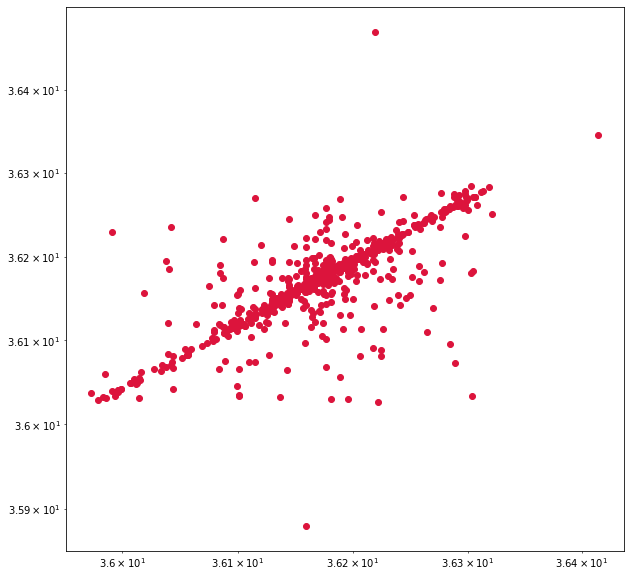

In [58]:
plt.figure(figsize=(10,10))
plt.scatter(y_test, y_pred, c='crimson')
plt.yscale('log')
plt.xscale('log')

p1 = max(max(y_pred), max(y_test))
p2 = min(min(y_pred), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.title('linear_regression prediction model')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.axis('equal')
plt.show()